<a href="https://colab.research.google.com/github/jessicasalazar/vision_computador/blob/main/Taller_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Workshop #2
1. Conduct an exploration of the dataset.
2. Extract features using a pre-trained model (ResNet-50, MobileNet, ...).
3. Train the classification head (recommended: AutoGluon).
4. Evaluate the model’s performance.

In [1]:
import os
import numpy as np
import pandas as pd

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Conduct an exploration of the dataset.

### DATASET: The LabelMe-12-50K

The dataset LabelMe-12-50k has 50,000 images: 40,000 for training, and 10,000 for testing. Each image is 256x256 pixels in size. The images are classified into one of 12 classes.

The dataset contains two types of files named annotations: The first is annotation.txt with the image file name and the class label corresponding; The second is annotation.bin which contain 12 successive 32-bit float values for each image, representing the class label of the corresponding class. Those annotation files are available to train and test.

50% of images in train and test are not classify in the 12 classes, else those are in clutter, that represent others. Furthermore, the error rate in the image classes is below.

| Method used                      | Training error rate | Testing error rate |
|----------------------------------|---------------------|--------------------|
| Locally-connected Neural Pyramid | 3.77%               | 16.27%             |


### Classes of the dataset

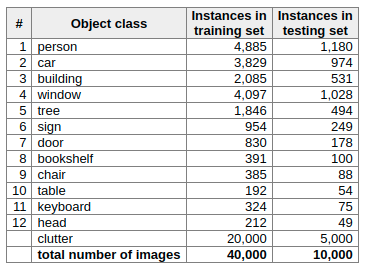

In [3]:
from IPython.display import Image, display
display(Image('/content/drive/MyDrive/Doctorado/Cursos/Vision_computador_aplicado/02_Clasificacion/LabelMe_classes.png'))

In [4]:
# Download the images in this section
!wget -qO- https://www.ais.uni-bonn.de/deep_learning/LabelMe-12-50k.tar.gz | tar -xz -C /content/

### Environment settings

In [5]:
# data_dir = "/content"
# split= "train"

In [6]:
# # Define the path for dataset
# classes_txt_path = os.path.join(data_dir, "classes.txt")
# txt_path = os.path.join(data_dir, split, "annotation.txt")
# bin_path = os.path.join(data_dir, split, "annotation.bin")

# # Open data about classes
# with open(classes_txt_path, encoding="utf-8") as f:
#     classes = [x.strip() for x in f if x.strip()]
# if len(classes) != 12:
#   raise ValueError(f"Se esperaban 12 clases en '{classes_txt_path}', hay {len(classes)}.")
# else:
#   print(f"Las categorías totales son: {len(classes)}")

# # Create the extra class, It is "clutter" and represent the 50% of the images
# classes_plus = classes + ["clutter"]

# # Read the file named "annotation.txt" to create the name of image and link with the label correspondig to the class
# df_txt = pd.read_csv(txt_path, sep=r"\s+", header=None, dtype={0: str}, engine="python")
# df_txt

# # Verify the IDs column in annotation.txt
# if df_txt.shape[1] < 1:
#     raise ValueError(f"'{txt_path}' no tiene columna de IDs.")
# ids = df_txt.iloc[:, 0].to_numpy()

# # Create the route for each image in this project
# images = [os.path.join(data_dir, split, '0'+i[0:3], i[-6:]+'.jpg') for i in ids]

# # Read the bin file
# raw = np.fromfile(bin_path, dtype=np.float32)

# # Verify the size of the matrix, should be 12
# if raw.size % 12 != 0:
#     raise ValueError(f"El binario '{bin_path}' no tiene múltiplo de 12 columnas (size={raw.size}).")

# # Reshape from vector to matrix
# scores = raw.reshape(-1, 12)

# # Clasify each image within the corresponding class
# is_one = np.isclose(scores, 1.0, atol=1e-6)
# has_obj = is_one.any(axis=1)
# first_one = is_one.argmax(axis=1)          # índice de la primera columna == 1.0
# int_label = np.where(has_obj, first_one, 12)
# str_label = [classes_plus[i] for i in int_label]

In [7]:
def load_split_from_bin_with_classes(data_dir, split, atol=1e-6):

  # Define the path for dataset
  classes_txt_path = os.path.join(data_dir, "classes.txt")
  txt_path = os.path.join(data_dir, split, "annotation.txt")
  bin_path = os.path.join(data_dir, split, "annotation.bin")

  # Open data about classes
  with open(classes_txt_path, encoding="utf-8") as f:
      classes = [x.strip() for x in f if x.strip()]
  if len(classes) != 12:
    raise ValueError(f"Se esperaban 12 clases en '{classes_txt_path}', hay {len(classes)}.")
  else:
    print(f"Las categorías totales son: {len(classes)}")

  # Create the extra class, It is "clutter" and represent the 50% of the images
  classes_plus = classes + ["clutter"]

  # Read the file named "annotation.txt" to create the name of image and link with the label correspondig to the class
  df_txt = pd.read_csv(txt_path, sep=r"\s+", header=None, dtype={0: str}, engine="python")
  df_txt

  # Verify the IDs column in annotation.txt
  if df_txt.shape[1] < 1:
      raise ValueError(f"'{txt_path}' no tiene columna de IDs.")
  ids = df_txt.iloc[:, 0].to_numpy()

  # Create the route for each image in this project
  images = [os.path.join(data_dir, split, '0'+i[0:3], i[-6:]+'.jpg') for i in ids]

  # Read the bin file
  raw = np.fromfile(bin_path, dtype=np.float32)

  # Verify the size of the matrix, should be 12
  if raw.size % 12 != 0:
      raise ValueError(f"El binario '{bin_path}' no tiene múltiplo de 12 columnas (size={raw.size}).")

  # Reshape from vector to matrix
  scores = raw.reshape(-1, 12)

  # Clasify each image within the corresponding class
  is_one = np.isclose(scores, 1.0, atol=atol)
  has_obj = is_one.any(axis=1)
  first_one = is_one.argmax(axis=1)          # índice de la primera columna == 1.0
  int_label = np.where(has_obj, first_one, 12)
  str_label = [classes_plus[i] for i in int_label]

  # Create the final dataset
  df = pd.DataFrame({
      "image": images,
      "label": int_label
      })
  return df

In [8]:
DATA_DIR = "/content"  # ajusta a tu ruta
train_df= load_split_from_bin_with_classes(DATA_DIR, "train")
test_df = load_split_from_bin_with_classes(DATA_DIR, "test")

# construir categorias
train_df.label = train_df.label.astype("category")
test_df.label = test_df.label.astype("category")

Las categorías totales son: 12
Las categorías totales son: 12


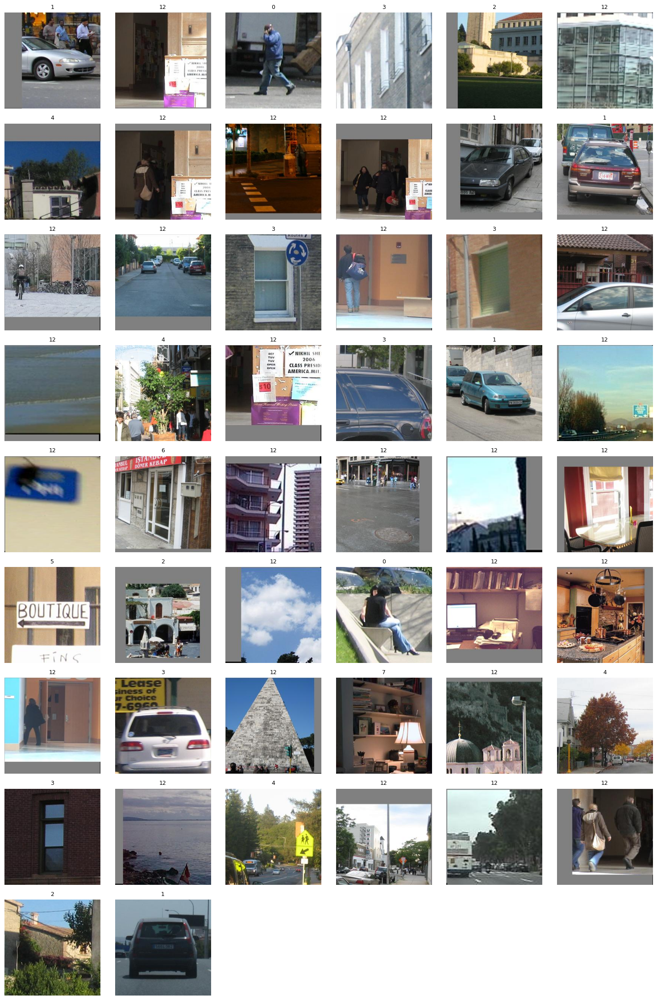

In [9]:
import math
import matplotlib.pyplot as plt

def ver_grid(df, n=12, cols=4):
    """
    Muestra un grid simple de imágenes con su etiqueta.
    Requiere columnas: 'img_path' y 'str_label' en df.
    """
    sel = df.sample(n=min(n, len(df))).reset_index(drop=True)
    rows = math.ceil(len(sel) / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols*2.5, rows*2.5))
    axes = axes.ravel() if rows*cols > 1 else [axes]

    for i, row in sel.iterrows():
        ax = axes[i]
        ax.imshow(plt.imread(row["image"]))
        ax.set_title(str(row["label"]), fontsize=9)
        ax.axis("off")

    # Oculta ejes sobrantes si no se llenó el grid
    for j in range(len(sel), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

ver_grid(train_df, 50, 6)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12')])

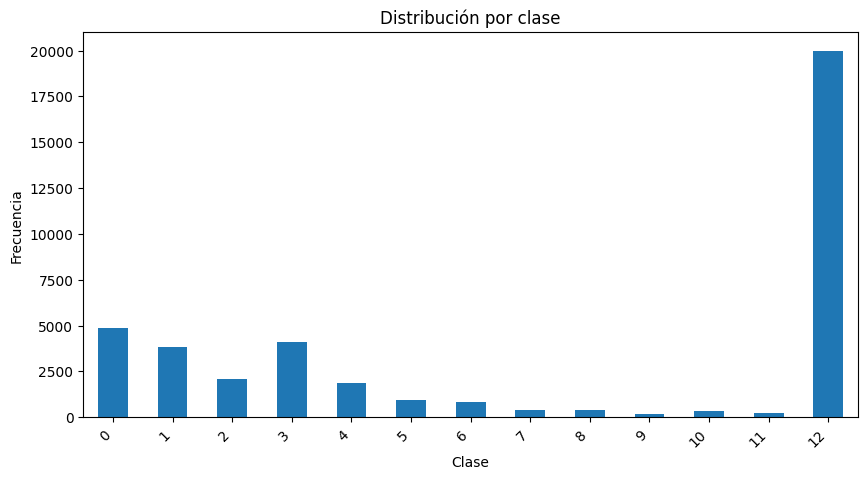

In [10]:
counts = train_df["label"].value_counts().sort_index()
fig = plt.figure(figsize=(10, 5))
counts.plot(kind="bar")
plt.title("Distribución por clase")
plt.xlabel("Clase")
plt.ylabel("Frecuencia")
plt.xticks(rotation=45, ha="right")

In [1]:
import argparse
from collections import Counter, defaultdict

def compute_image_features(df, max_per_class=0):
    """Calcula ancho, alto, área, aspecto y medias de R/G/B + brillo por imagen.
    max_per_class=0 usa todas; >0 limita por clase para acelerar.
    """
    rows = []
    by_class_counter = Counter()
    for _, r in df.iterrows():
        lbl = r["str_label"]
        if max_per_class > 0 and by_class_counter[lbl] >= max_per_class:
            continue
        path = r["image"]
        try:
            with Image.open(path) as im:
                im = im.convert("RGB")
                w, h = im.size
                arr = np.asarray(im, dtype=np.float32)
                mean_r = float(arr[:, :, 0].mean())
                mean_g = float(arr[:, :, 1].mean())
                mean_b = float(arr[:, :, 2].mean())
                brightness = float(arr.mean())
            rows.append({
                "image": path,
                "str_label": lbl,
                "width": w,
                "height": h,
                "area": w * h,
                "aspect_ratio": w / h if h > 0 else np.nan,
                "mean_r": mean_r,
                "mean_g": mean_g,
                "mean_b": mean_b,
                "brightness": brightness
            })
            by_class_counter[lbl] += 1
        except Exception:
            # Skip unreadable images
            continue
    feats = pd.DataFrame(rows)
    return feats

# Carga de splits
prepared = {}
combined_rows = []
classes, classes_plus = None, None

p = argparse.ArgumentParser(description="EDA para LabelMe 12-50k")
p.add_argument("--data_dir", type=str, default="/content")
p.add_argument("--out_dir", type=str, default="./eda_output")
p.add_argument("--split", nargs="+", default=["train", "test"])
p.add_argument("--max_per_class", type=int, default=0)
p.add_argument("--min_edge_weight", type=int, default=1)

# En notebooks usa parse_known_args (o parse_args([]))
args, _ = p.parse_known_args()   # <-- clave

for split in args.split:
    df, scores = load_split_from_bin_with_classes(args.data_dir, split)
    prepared[split] = {"df": df, "scores": scores}

feats_all = []
for split in args.split:
  feats = compute_image_features(prepared[split]["df"], max_per_class=args.max_per_class)
  feats["split"] = split
  feats_all.append(feats)

# feats_all = pd.concat(feats_all, ignore_index=True)
# value_col =  feats_all["brightness"]

# order = sorted(feats["str_label"].dropna().unique().tolist())
# data = [feats.loc[feats["str_label"] == cls, value_col].dropna().values for cls in order]
# fig = plt.figure(figsize=(12,6))
# plt.boxplot(data, labels=order, showfliers=False)
# plt.title(f"Gráfico de bigotes por clase — {value_col}")
# plt.xlabel("Clase")
# plt.ylabel(value_col)
# plt.xticks(rotation=45, ha="right")

NameError: name 'load_split_from_bin_with_classes' is not defined

# 2. Extract features using a pre-trained model (ResNet-50, MobileNet, ...).

# 3. Train the classification head (recommended: AutoGluon).

In [11]:
! pip install autogluon

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 14.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━

In [12]:
# Celda 5 — split estratificado 70/15/15
from sklearn.model_selection import train_test_split

df_train, df_val = train_test_split(train_df, test_size=0.20, stratify=train_df["label"], random_state=42)


In [13]:
from autogluon.multimodal import MultiModalPredictor

In [14]:
predictor = MultiModalPredictor(problem_type="multiclass", label='label')

In [15]:
hparams = {
    "model.names" : ["timm_image"],
    "model.timm_image.checkpoint_name": "resnet50",
    "optim.lr_choice": "two_stages",
    "optim.lr_mult": 50,
    "optim.lr": 1e-4,
    "optim.max_epochs": 5,
    "optim.patience": 5
}

In [16]:
predictor.fit(
    hyperparameters = hparams,
    presets = "medium_quality",
    train_data = df_train,
    tuning_data = df_val
)

No path specified. Models will be saved in: "AutogluonModels/ag-20251007_214235"
=================== System Info ===================
AutoGluon Version:  1.4.0
Python Version:     3.11.13
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Sat Sep  6 09:54:41 UTC 2025
CPU Count:          2
Pytorch Version:    2.6.0+cu124
CUDA Version:       12.4
GPU Count:          1
Memory Avail:       8.03 GB / 12.67 GB (63.4%)
Disk Space Avail:   26.23 GB / 73.59 GB (35.6%)

AutoMM starts to create your model. ✨✨✨

To track the learning progress, you can open a terminal and launch Tensorboard:
    ```shell
    # Assume you have installed tensorboard
    tensorboard --logdir /content/AutogluonModels/ag-20251007_214235
    ```

INFO: Seed set to 0
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your 

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

GPU Count: 1
GPU Count to be Used: 1

INFO: Using 16bit Automatic Mixed Precision (AMP)
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO: 
  | Name              | Type                            | Params | Mode 
------------------------------------------------------------------------------
0 | model             | TimmAutoModelForImagePrediction | 23.5 M | train
1 | validation_metric | MulticlassAccuracy              | 0      | train
2 | loss_func         | CrossEntropyLoss                | 0      | train
------------------------------------------------------------------------------
23.5 M    Trainable params
0         N

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 125: 'val_accuracy' reached 0.76800 (best 0.76800), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=0-step=125.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 250: 'val_accuracy' reached 0.84475 (best 0.84475), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=0-step=250.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 375: 'val_accuracy' reached 0.88437 (best 0.88437), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=1-step=375.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 500: 'val_accuracy' reached 0.90700 (best 0.90700), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=1-step=500.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 625: 'val_accuracy' reached 0.91612 (best 0.91612), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=2-step=625.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 750: 'val_accuracy' reached 0.92488 (best 0.92488), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=2-step=750.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 875: 'val_accuracy' reached 0.93012 (best 0.93012), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=3-step=875.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 1000: 'val_accuracy' reached 0.93063 (best 0.93063), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=3-step=1000.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 1125: 'val_accuracy' reached 0.93362 (best 0.93362), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=4-step=1125.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 1250: 'val_accuracy' reached 0.93463 (best 0.93463), saving model to '/content/AutogluonModels/ag-20251007_214235/epoch=4-step=1250.ckpt' as top 3
INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
Start to fuse 3 checkpoints via the greedy soup algorithm.
INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

AutoMM has created your model. 🎉🎉🎉

To load the model, use the code below:
    ```python
    from autogluon.multimodal import MultiModalPredictor
    predictor = MultiModalPredictor.load("/content/AutogluonModels/ag-20251007_214235")
    ```

If you are not satisfied with the model, try to increase the training time, 
adjust the hyperparameters (https://auto.gluon.ai/stable/tutorials/multimodal/advanced_topics/customization.html),
or post issues on GitHub (https://github.com/autogluon/autogluon/issues).




In [17]:
predictor.evaluate(df_val)

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

{'accuracy': 0.93475}

In [18]:
predictor.evaluate(test_df)

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

{'accuracy': 0.931}

### Visualize tensorboard

In [19]:
!pip -q install tensorboard

In [41]:
import os, glob
LOGROOT = "/content/AutogluonModels/ag-20251007_214235"  # o: LOGROOT = predictor.path
event_dirs = sorted({os.path.dirname(p) for p in glob.glob(os.path.join(LOGROOT, "**/events.out.tfevents.*"), recursive=True)})
print("Carpetas con eventos:\n", "\n".join(event_dirs) or "(no se encontraron)")

Carpetas con eventos:
 /content/AutogluonModels/ag-20251007_214235


In [43]:
# Load the Colab's extention
%load_ext tensorboard

# TensorBoard to my folder of logs
%tensorboard --logdir /content/AutogluonModels/ag-20251007_214235 --reload_interval 15


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [21]:
# y verdadero, predicción y probabilidades
y_true = df_val['label']
y_pred = predictor.predict(df_val)
proba_df = predictor.predict_proba(df_val)

# Lista de clases (en el mismo orden que las columnas de predict_proba)
classes = list(proba_df.columns)

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Predicting: |          | 0/? [00:00<?, ?it/s]

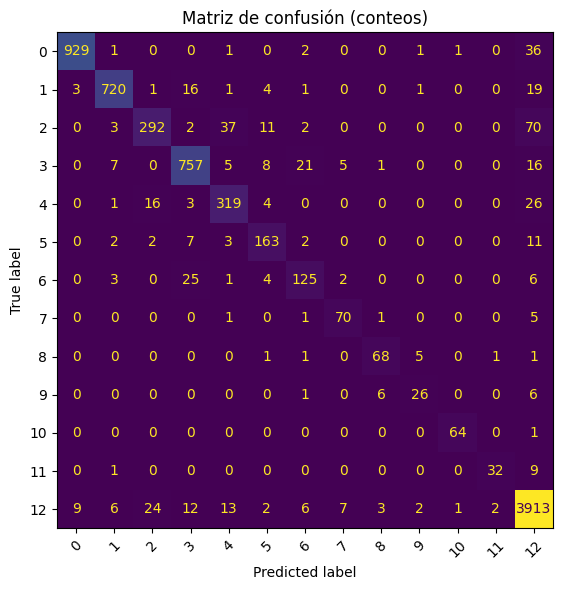

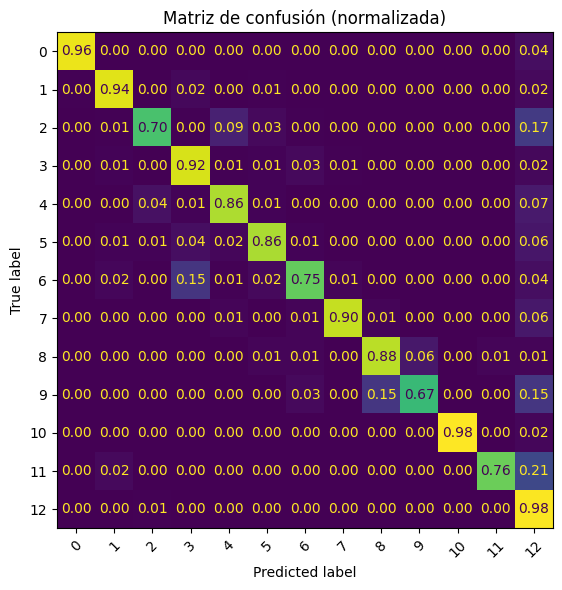

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_true, y_pred, labels=classes)

# Conteos
fig, ax = plt.subplots(figsize=(6,6))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes).plot(ax=ax, xticks_rotation=45, colorbar=False)
ax.set_title("Matriz de confusión (conteos)")
plt.tight_layout()
plt.show()

# Normalizada por clase verdadera
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
fig, ax = plt.subplots(figsize=(6,6))
ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=classes).plot(
    ax=ax, xticks_rotation=45, values_format=".2f", colorbar=False
)
ax.set_title("Matriz de confusión (normalizada)")
plt.tight_layout()
plt.show()

In [23]:
from sklearn.metrics import classification_report

report = classification_report(y_true, y_pred, target_names=classes, output_dict=True, zero_division=0)
pd.DataFrame(report).T  # Míralo como tabla

,precision,recall,f1-score,support
0,0.987248,0.956746,0.971757,971.00000
1,0.967742,0.939948,0.953642,766.00000
2,0.871642,0.700240,0.776596,417.00000
3,0.920925,0.923171,0.922046,820.00000
4,0.837270,0.864499,0.850667,369.00000
5,0.827411,0.857895,0.842377,190.00000
6,0.771605,0.753012,0.762195,166.00000
7,0.833333,0.897436,0.864198,78.00000
8,0.860759,0.883117,0.871795,77.00000
9,0.742857,0.666667,0.702703,39.00000


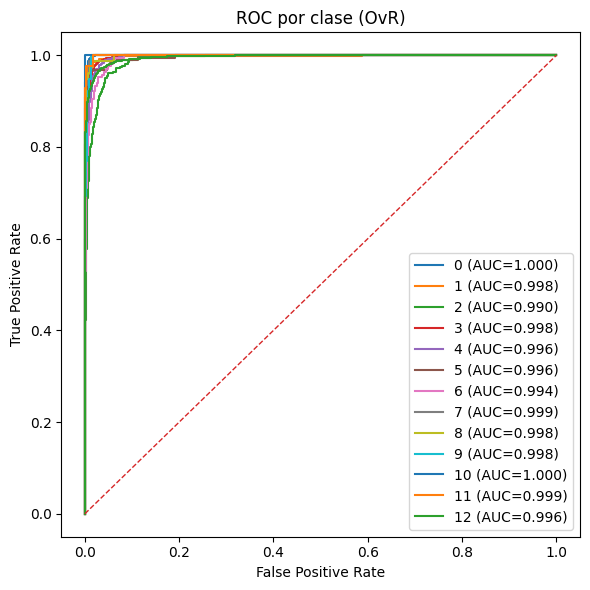

AUC macro: 0.9970 | AUC micro: 0.9983


In [24]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_true_bin = label_binarize(y_true, classes=classes)
y_score = proba_df[classes].values  # Asegurar orden

# ROC por clase
fig = plt.figure(figsize=(6,6))
for i, cls in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    plt.plot(fpr, tpr, label=f"{cls} (AUC={auc(fpr, tpr):.3f})")
plt.plot([0,1],[0,1],'--', lw=1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC por clase (OvR)")
plt.legend()
plt.tight_layout()
plt.show()

# AUC macro y micro
auc_macro = roc_auc_score(y_true_bin, y_score, average="macro", multi_class="ovr")
auc_micro = roc_auc_score(y_true_bin, y_score, average="micro", multi_class="ovr")
print(f"AUC macro: {auc_macro:.4f} | AUC micro: {auc_micro:.4f}")


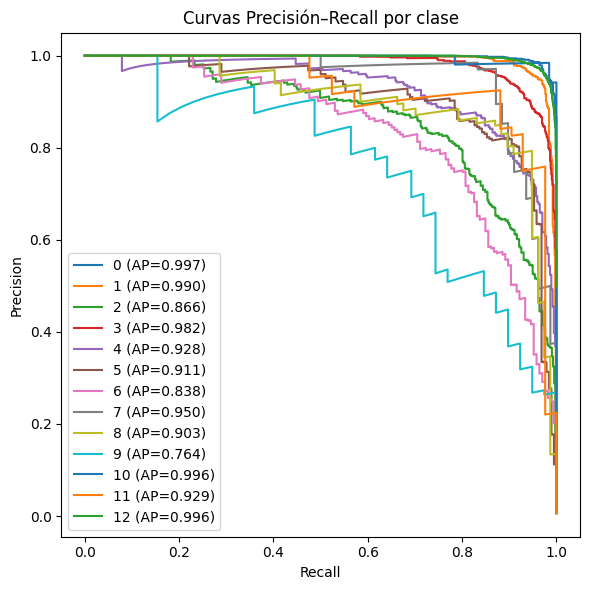

In [25]:
from sklearn.metrics import precision_recall_curve, average_precision_score

fig = plt.figure(figsize=(6,6))
for i, cls in enumerate(classes):
    prec, rec, _ = precision_recall_curve(y_true_bin[:, i], y_score[:, i])
    ap = average_precision_score(y_true_bin[:, i], y_score[:, i])
    plt.plot(rec, prec, label=f"{cls} (AP={ap:.3f})")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Curvas Precisión–Recall por clase")
plt.legend()
plt.tight_layout()
plt.show()


In [26]:
from sklearn.metrics import top_k_accuracy_score

for k in (1, 3, 5):
    if k <= len(classes):
        tk = top_k_accuracy_score(y_true, y_score, k=k, labels=classes)
        print(f"Top-{k} accuracy: {tk:.4f}")


Top-1 accuracy: 0.9347
Top-3 accuracy: 0.9955
Top-5 accuracy: 0.9988


In [27]:
cm_off = cm.copy().astype(int)
np.fill_diagonal(cm_off, 0)
pairs = [(classes[i], classes[j], cm_off[i, j])
         for i in range(len(classes)) for j in range(len(classes)) if i != j and cm_off[i, j] > 0]
pd.DataFrame(sorted(pairs, key=lambda x: x[2], reverse=True)[:10],
             columns=["Verdadero", "Predicho", "Conteos"])


,Verdadero,Predicho,Conteos
0,2,12,70
1,2,4,37
2,0,12,36
3,4,12,26
4,6,3,25
5,12,2,24
6,3,6,21
7,1,12,19
8,1,3,16
9,3,12,16
